載入套件

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import talib as ta
import datetime
import vectorbt as vbt
import optuna
import hiplot as hip
import warnings

warnings.filterwarnings("ignore")

讀取資料並檢查資料無誤

In [12]:
import datetime
import pandas as pd
import numpy as np

# 設定起始日期和結束日期
end_date = datetime.datetime.now()
start_date = datetime.datetime(2021, 1, 1)  

# 初始化一個空的 DataFrame 用來存儲資料
all_data = pd.DataFrame()

# 設定每次抓取的時間區間
interval_days = 730

# 設定迴圈的次數
num_iterations = (end_date - start_date).days // interval_days + 1

for i in range(num_iterations):
    # 計算迭代的起始日期和結束日期
    iteration_start = start_date + datetime.timedelta(days=i * interval_days)
    iteration_end = min(iteration_start + datetime.timedelta(days=interval_days), end_date)

    # 抓取資料
    iteration_data = vbt.YFData.download('BTC-USD',  
                                        interval='1h',  
                                        start=iteration_start,
                                        end=iteration_end).get(['Close', 'High', 'Low'])

    # 合併資料到 all_data
    all_data = pd.concat([all_data, iteration_data])

# 顯示總共抓取的資料量
print(f"Total rows of data: {len(all_data)}")

BTC-USD: 1h data not available for startTime=1609430400 and endTime=1672502400. The requested range must be within the last 730 days.


Total rows of data: 8133


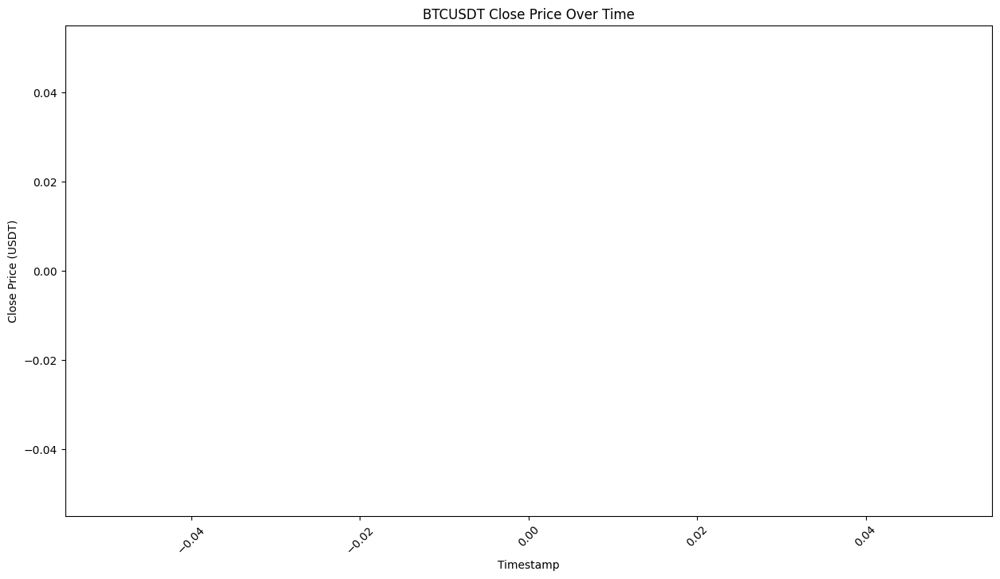

In [3]:
plt.figure(figsize=(15, 8))
plt.plot(all_data.index, all_data['Close'], label='Closing Price')
plt.title('BTCUSDT Close Price Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Close Price (USDT)')
plt.xticks(rotation=45)
plt.show()

切割資料

In [4]:
split_index = int(len(all_data) * 0.8)

train_data = all_data[:split_index]
test_data = all_data[split_index:]

策略一：DMA+ADX 順勢

maximize return

In [5]:
import optuna
import numpy as np
import pandas as pd

# 定義目標函數
def objective(trial):
    # 在這裡定義您要嘗試優化的參數
    emafast_period = trial.suggest_int('emafast_period', 7, 28)
    emaslow_period = trial.suggest_int('emaslow_period', 29, 56)
    ADX_period = trial.suggest_int('ADX_period', 10, 30)
    timeperiod = trial.suggest_int('timeperiod', 7, 56)
    
    train_data['EMAslow'] = ta.EMA(train_data['Close'], emaslow_period)
    train_data['EMAfast'] = ta.EMA(train_data['Close'], emafast_period)
    train_data['ADX'] = ta.ADX(train_data['High'], train_data['Low'], train_data['Close'], timeperiod)
    
    
    # 產生進場信號
    sig = pd.DataFrame(columns = ['long_entry', 'long_exit','short_entry', 'short_exit'])
    sig['long_entry'] = np.where((train_data['EMAfast'] > train_data['EMAslow']) & (train_data['ADX'] > ADX_period), 1, 0)
    sig['long_exit'] = np.where((train_data['EMAfast'] < train_data['EMAslow']) | (train_data['ADX'] < ADX_period), 1, 0)
    sig['short_entry'] = np.where((train_data['EMAfast'] < train_data['EMAslow']) & (train_data['ADX'] > ADX_period), 1, 0)
    sig['short_exit'] = np.where((train_data['EMAfast'] > train_data['EMAslow']) | (train_data['ADX'] < ADX_period), 1, 0)

    pf1 = vbt.Portfolio.from_signals(train_data['Close'],
                                entries=sig['long_entry'],
                                exits=sig['long_exit'],
                                short_entries=sig['short_entry'],
                                short_exits=sig['short_exit'],
                                freq='h',
                                fees = 0.001,
                                slippage=0.01)
    a = pf1.stats()
    
    return a['Total Return [%]']  # optuna 會嘗試最小化這個值

# 執行 optuna 最佳化
study = optuna.create_study(direction='maximize')  # 注意這裡使用 'maximize'，因為我們希望最大化收益率
study.optimize(objective, n_trials=500)

# 獲取最佳參數
print(f"Best Parameters: {study.best_params}")
print("Best value:", study.best_value)


[I 2023-12-06 18:21:47,783] A new study created in memory with name: no-name-d265c5c5-2fa1-453e-8a22-631c54fc90ae
[W 2023-12-06 18:21:47,786] Trial 0 failed with parameters: {'emafast_period': 19, 'emaslow_period': 45, 'ADX_period': 10, 'timeperiod': 17} because of the following error: Exception('inputs are all NaN').
Traceback (most recent call last):
  File "c:\ProgramData\anaconda3\envs\stock\lib\site-packages\optuna\study\_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_14456\3885334709.py", line 13, in objective
    train_data['EMAslow'] = ta.EMA(train_data['Close'], emaslow_period)
  File "c:\ProgramData\anaconda3\envs\stock\lib\site-packages\talib\__init__.py", line 64, in wrapper
    result = func(*_args, **_kwds)
  File "talib/_func.pxi", line 2931, in talib._ta_lib.EMA
  File "talib/_func.pxi", line 68, in talib._ta_lib.check_begidx1
Exception: inputs are all NaN
[W 2023-12-06 18:21:47,788] Trial 0 

Exception: inputs are all NaN

In [ ]:
hip.Experiment.from_optuna(study).display()

<IPython.core.display.Javascript object>

train result

In [ ]:
EMAfast_p = study.best_params['emafast_period']
EMAslow_p = study.best_params['emaslow_period']
ADX_threshold_p = study.best_params['ADX_period']
timeperiod_p = study.best_params['timeperiod']

In [ ]:
train_data['EMAslow'] = ta.EMA(train_data['Close'], EMAslow_p)
train_data['EMAfast'] = ta.EMA(train_data['Close'], EMAfast_p)
train_data['ADX'] = ta.ADX(train_data['High'], train_data['Low'], train_data['Close'], timeperiod_p)
    
    
# 產生進場信號
sig = pd.DataFrame(columns = ['long_entry', 'long_exit','short_entry', 'short_exit'])
sig['long_entry'] = np.where((train_data['EMAfast'] > train_data['EMAslow']) & (train_data['ADX'] > ADX_threshold_p), 1, 0)
sig['long_exit'] = np.where((train_data['EMAfast'] < train_data['EMAslow']) | (train_data['ADX'] < ADX_threshold_p), 1, 0)
sig['short_entry'] = np.where((train_data['EMAfast'] < train_data['EMAslow']) & (train_data['ADX'] > ADX_threshold_p), 1, 0)
sig['short_exit'] = np.where((train_data['EMAfast'] > train_data['EMAslow']) | (train_data['ADX'] < ADX_threshold_p), 1, 0)

pft = vbt.Portfolio.from_signals(train_data['Close'],
                                entries=sig['long_entry'],
                                exits=sig['long_exit'],
                                short_entries=sig['short_entry'],
                                short_exits=sig['short_exit'],
                                freq='h',
                                fees = 0.001,
                                slippage=0.01)
pft.stats()

In [ ]:
fig = pft.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()

test result

In [ ]:
test_data['ADX'] = ta.ADX(test_data['High'], test_data['Low'], test_data['Close'], timeperiod_p)
test_data['EMAslow'] = ta.EMA(test_data['Close'], EMAslow_p)
test_data['EMAfast'] = ta.EMA(test_data['Close'], EMAfast_p)

signal = pd.DataFrame(columns=['long_entry', 'long_exit', 'short_entry', 'short_exit'])
signal['long_entry'] = np.where((test_data['EMAfast'] > test_data['EMAslow']) & (test_data['ADX'] > ADX_threshold_p), 1, 0)
signal['long_exit'] = np.where((test_data['EMAfast'] < test_data['EMAslow']) | (test_data['ADX'] < ADX_threshold_p), 1, 0)
signal['short_entry'] = np.where((test_data['EMAfast'] < test_data['EMAslow']) & (test_data['ADX'] > ADX_threshold_p), 1, 0)
signal['short_exit'] = np.where((test_data['EMAfast'] > test_data['EMAslow']) | (test_data['ADX'] < ADX_threshold_p), 1, 0)

pf1 = vbt.Portfolio.from_signals(test_data['Close'],
                                entries=signal['long_entry'],
                                exits=signal['long_exit'],
                                short_entries=signal['short_entry'],
                                short_exits=signal['short_exit'],
                                freq='h',
                                fees = 0.001,
                                slippage=0.01)
pf1.stats()

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2174391661.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2174391661.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2174391661.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Start                         2023-09-29 12:00:00+00:00
End                           2023-12-06 06:00:00+00:00
Period                                 67 days 18:00:00
Start Value                                       100.0
End Value                                    127.037348
Total Return [%]                              27.037348
Benchmark Return [%]                          61.850965
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                               4.789127
Max Drawdown Duration                  39 days 18:00:00
Total Trades                                          6
Total Closed Trades                                   5
Total Open Trades                                     1
Open Trade PnL                                11.597241
Win Rate [%]                                       40.0
Best Trade [%]                                18.863594
Worst Trade [%]                               -2

In [ ]:
fig = pf1.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()

策略二：meanreversion 逆勢

In [ ]:
# 定義目標函數
def objective(trial):
    # 在這裡定義您要嘗試優化的參數
    
    length1_period = trial.suggest_int('length1_period', 24, 240)
    length2_period = trial.suggest_int('length2_period', 24, 240)
    EntryLevel_period = trial.suggest_float('EntryLevel_period', 0, 5)
    StopLossLevel_period = trial.suggest_float('StopLossLevel_period', 4, 7)
    TakeProfitLevel_period = trial.suggest_float('TakeProfitLevel_period', 0, 6)
    
    train_data['SMA'] = ta.SMA(train_data['Close'], timeperiod=length1_period)
    train_data['spread'] = train_data['Close'] - train_data['SMA']
    train_data['meanSpread'] = ta.SMA(train_data['spread'], timeperiod=length2_period)
    train_data['stdDev'] = ta.STDDEV(train_data['spread'], timeperiod=length2_period)
    train_data['zScore'] = (train_data['spread'] - train_data['meanSpread']) / train_data['stdDev']

    # 產生進場信號
    sig = pd.DataFrame(columns=['long_entry', 'long_exit', 'short_entry', 'short_exit'])
    sig['long_entry'] = np.where((train_data['zScore'] < -EntryLevel_period), 1, 0)
    sig['long_exit'] = np.where((train_data['zScore'] < -StopLossLevel_period) | (train_data['zScore'] > TakeProfitLevel_period), 1, 0)
    sig['short_entry'] = np.where((train_data['zScore'] > EntryLevel_period), 1, 0)
    sig['short_exit'] = np.where((train_data['zScore'] > StopLossLevel_period) | (train_data['zScore'] < -TakeProfitLevel_period), 1, 0)

    pf = vbt.Portfolio.from_signals(train_data['Close'],
                                    entries=sig['long_entry'],
                                    exits=sig['long_exit'],
                                    short_entries=sig['short_entry'],
                                    short_exits=sig['short_exit'],
                                    freq='h',
                                    fees = 0.001,
                                    slippage=0.01)
    a = pf.stats()

    
    return a['Total Return [%]']  # optuna 會嘗試最小化這個值

# 執行 optuna 最佳化
study2 = optuna.create_study(direction='maximize')  # 注意這裡使用 'maximize'，因為我們希望最大化收益率
study2.optimize(objective, n_trials=500)

# 獲取最佳參數
print(f"Best Parameters: {study2.best_params}")

print("Best value:", study2.best_value)

[I 2023-12-06 15:08:43,661] A new study created in memory with name: no-name-e3de98ee-2bb5-4d59-9b50-a845752d064e
C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\3059881167.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\3059881167.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\3059881167.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try us

Best Parameters: {'length1_period': 235, 'length2_period': 106, 'EntryLevel_period': 4.375611722877905, 'StopLossLevel_period': 6.605318723141029, 'TakeProfitLevel_period': 4.9038492222303915}
Best value: 188.16020414902272


In [ ]:
hip.Experiment.from_optuna(study2).display()

<IPython.core.display.Javascript object>

In [ ]:
# Inputs
length1 = study2.best_params['length1_period']
length2 = study2.best_params['length2_period']
EntryLevel = study2.best_params['EntryLevel_period']
StopLossLevel = study2.best_params['StopLossLevel_period']
TakeProfitLevel = study2.best_params['TakeProfitLevel_period']

# length1 = 190
# length2 = 110
# EntryLevel = 4.5
# StopLossLevel = 6.25
# TakeProfitLevel = 4.75

train_data['SMA'] = ta.SMA(train_data['Close'], timeperiod=length1)
train_data['spread'] = train_data['Close'] - train_data['SMA']
train_data['meanSpread'] = ta.SMA(train_data['spread'], timeperiod=length2)
train_data['stdDev'] = ta.STDDEV(train_data['spread'], timeperiod=length2)
train_data['zScore'] = (train_data['spread'] - train_data['meanSpread']) / train_data['stdDev']

# 產生進場信號
sig2 = pd.DataFrame(columns=['long_entry', 'long_exit', 'short_entry', 'short_exit'])
sig2['long_entry'] = np.where((train_data['zScore'] < -EntryLevel), 1, 0)
sig2['long_exit'] = np.where((train_data['zScore'] < -StopLossLevel) | (train_data['zScore'] > TakeProfitLevel), 1, 0)
sig2['short_entry'] = np.where((train_data['zScore'] > EntryLevel), 1, 0)
sig2['short_exit'] = np.where((train_data['zScore'] > StopLossLevel) | (train_data['zScore'] < -TakeProfitLevel), 1, 0)

pf3 = vbt.Portfolio.from_signals(train_data['Close'],
                                entries=sig2['long_entry'],
                                exits=sig2['long_exit'],
                                short_entries=sig2['short_entry'],
                                short_exits=sig2['short_exit'],
                                freq='h',
                                fees = 0.001,
                                slippage=0.01)
pf3.stats()

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2009415932.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2009415932.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2009415932.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

Start                          2022-12-31 16:00:00+00:00
End                            2023-09-29 11:00:00+00:00
Period                                 270 days 23:00:00
Start Value                                        100.0
End Value                                     288.160204
Total Return [%]                              188.160204
Benchmark Return [%]                           62.480528
Max Gross Exposure [%]                             100.0
Total Fees Paid                                      0.0
Max Drawdown [%]                                9.166559
Max Drawdown Duration                   17 days 16:00:00
Total Trades                                           8
Total Closed Trades                                    7
Total Open Trades                                      1
Open Trade PnL                                  5.022416
Win Rate [%]                                       100.0
Best Trade [%]                                 39.328527
Worst Trade [%]                

In [ ]:
fig = pf3.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()

In [ ]:
test_data['SMA'] = ta.SMA(test_data['Close'], timeperiod=length1)
test_data['spread'] = test_data['Close'] - test_data['SMA']
test_data['meanSpread'] = ta.SMA(test_data['spread'], timeperiod=length2)
test_data['stdDev'] = ta.STDDEV(test_data['spread'], timeperiod=length2)
test_data['zScore'] = (test_data['spread'] - test_data['meanSpread']) / test_data['stdDev']

signal2 = pd.DataFrame(columns = ['long_entry', 'long_exit','short_entry', 'short_exit'])
signal2['long_entry'] = np.where((test_data['zScore'] < -EntryLevel ), 1, 0)
signal2['long_exit'] = np.where((test_data['zScore'] < -StopLossLevel ) | (test_data['zScore'] > TakeProfitLevel ), 1, 0 )
signal2['short_entry'] = np.where((test_data['zScore'] > EntryLevel ), 1, 0)
signal2['short_exit'] = np.where((test_data['zScore'] > StopLossLevel ) | (test_data['zScore'] < -TakeProfitLevel ), 1, 0 )

pf2 = vbt.Portfolio.from_signals(test_data['Close'],
                                entries=signal2['long_entry'],
                                exits=signal2['long_exit'],
                                short_entries=signal2['short_entry'],
                                short_exits=signal2['short_exit'],
                                freq='h',
                                fees = 0.001,
                                slippage=0.01)
pf2.stats()

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\1458852354.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\1458852354.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\1458852354.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Start                         2023-09-29 12:00:00+00:00
End                           2023-12-06 06:00:00+00:00
Period                                 67 days 18:00:00
Start Value                                       100.0
End Value                                      43.35034
Total Return [%]                              -56.64966
Benchmark Return [%]                          61.850965
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                              58.852463
Max Drawdown Duration                  50 days 18:00:00
Total Trades                                          1
Total Closed Trades                                   0
Total Open Trades                                     1
Open Trade PnL                                -56.64966
Win Rate [%]                                        NaN
Best Trade [%]                                      NaN
Worst Trade [%]                                 

In [ ]:
fig = pf2.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()

策略三：RSI+MA 逆勢

In [ ]:
# 定義目標函數
def objective(trial):
    rsi_period = trial.suggest_int('rsi_period', 7, 240)
    ma_period = trial.suggest_int('ma_period', 7, 240)  
    rsi_overbought = trial.suggest_int('rsi_overbought', 50, 99)  
    rsi_oversold = trial.suggest_int('rsi_oversold', 1, 50)
    
    # 計算 RSI 和移動平均線
    train_data['RSI'] = ta.RSI(train_data['Close'], timeperiod=rsi_period)
    train_data['MA'] = ta.SMA(train_data['Close'], timeperiod=ma_period)

    # 生成進出場信號
    sig = pd.DataFrame(columns=['long_entry', 'long_exit', 'short_entry', 'short_exit'])
    sig['long_entry'] = np.where((train_data['RSI'] < rsi_oversold) & (train_data['Close'] < train_data['MA']), 1, 0)
    sig['long_exit'] = np.where((train_data['RSI'] < rsi_oversold) | (train_data['Close'] < train_data['MA']), 1, 0)
    sig['short_entry'] = np.where((train_data['RSI'] > rsi_overbought) & (train_data['Close'] >train_data['MA']), 1, 0)
    sig['short_exit'] = np.where((train_data['RSI'] > rsi_overbought) | (train_data['Close'] >train_data['MA']), 1, 0)


    pf = vbt.Portfolio.from_signals(train_data['Close'],
                                    entries=sig['long_entry'],
                                    exits=sig['long_exit'],
                                    short_entries=sig['short_entry'],
                                    short_exits=sig['short_exit'],
                                    freq='h',
                                    fees = 0.001,
                                    slippage=0.01)
    a = pf.stats()

    
    return a['Total Return [%]']  # optuna 會嘗試最小化這個值

# 執行 optuna 最佳化
study3 = optuna.create_study(direction='maximize')  # 注意這裡使用 'maximize'，因為我們希望最大化收益率
study3.optimize(objective, n_trials=500)

# 獲取最佳參數
best_params = study3.best_params
print(f"Best Parameters: {best_params}")

best_value = study3.best_value
print("Best value:", best_value)

[I 2023-12-06 14:52:29,936] A new study created in memory with name: no-name-772a77d9-8bea-4585-8e45-a23802dd1369
C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2753089104.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HSU HAO\AppData\Local\Temp\ipykernel_3016\2753089104.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

[I 2023-12-06 14:52:30,106] Trial 0 finished with value: 0.0 and parameters: {'rsi_period': 146, 'ma_period': 132, 'rsi_overbought': 52, 'rsi_oversold': 50}. Best is tri

Best Parameters: {'rsi_period': 146, 'ma_period': 132, 'rsi_overbought': 52, 'rsi_oversold': 50}
Best value: 0.0


In [ ]:
hip.Experiment.from_optuna(study3).display()

<IPython.core.display.Javascript object>

In [ ]:
#Inputs
rsi_period = best_params['rsi_period']
ma_period = best_params['ma_period']
rsi_overbought = best_params['rsi_overbought']
rsi_oversold = best_params['rsi_oversoldd']

# 計算 RSI 和移動平均線
train_data['RSI'] = ta.RSI(train_data['Close'], timeperiod=rsi_period)
train_data['MA'] = ta.SMA(train_data['Close'], timeperiod=ma_period)

# 生成進出場信號
sig = pd.DataFrame(columns=['long_entry', 'long_exit', 'short_entry', 'short_exit'])
sig['long_entry'] = np.where((train_data['RSI'] < rsi_oversold) & (train_data['Close'] < train_data['MA']), 1, 0)
sig['long_exit'] = np.where((train_data['RSI'] < rsi_oversold) | (train_data['Close'] < train_data['MA']), 1, 0)
sig['short_entry'] = np.where((train_data['RSI'] > rsi_overbought) & (train_data['Close'] >train_data['MA']), 1, 0)
sig['short_exit'] = np.where((train_data['RSI'] > rsi_overbought) | (train_data['Close'] >train_data['MA']), 1, 0)


pf4 = vbt.Portfolio.from_signals(train_data['Close'],
                                entries=sig['long_entry'],
                                exits=sig['long_exit'],
                                short_entries=sig['short_entry'],
                                short_exits=sig['short_exit'],
                                freq='h',
                                fees = 0.001,
                                slippage=0.01)
pf4.stats()

In [ ]:
fig = pf4.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()

In [ ]:
test_data['RSI'] = ta.RSI(test_data['Close'], timeperiod=rsi_period)
test_data['MA'] = ta.SMA(test_data['Close'], timeperiod=ma_period)

# 生成進出場信號
sig = pd.DataFrame(columns=['long_entry', 'long_exit', 'short_entry', 'short_exit'])
sig['long_entry'] = np.where((test_data['RSI'] < rsi_oversold) & (test_data['Close'] < test_data['MA']), 1, 0)
sig['long_exit'] = np.where((test_data['RSI'] < rsi_oversold) | (test_data['Close'] < test_data['MA']), 1, 0)
sig['short_entry'] = np.where((test_data['RSI'] > rsi_overbought) & (test_data['Close'] > test_data['MA']), 1, 0)
sig['short_exit'] = np.where((test_data['RSI'] > rsi_overbought) | (test_data['Close'] > test_data['MA']), 1, 0)

pf4 = vbt.Portfolio.from_signals(test_data['Close'],
                                entries=sig['long_entry'],
                                exits=sig['long_exit'],
                                short_entries=sig['short_entry'],
                                short_exits=sig['short_exit'],
                                freq='h',
                                fees = 0.001,
                                slippage=0.01)
pf4.stats()


In [ ]:
fig = pf4.plot(subplots=['cum_returns', 'orders', 'trade_pnl'])
fig.show()